# Libraries and Classes

In [1]:
%run -i src/raw_import.py
%run -i src/class_prm_eco.py
%run -i src/class_prm_tech.py
%run -i src/class_technos.py

# Scenario Framework

## Economy

In [9]:
r = 0.05

## Time

In [2]:
timestep_per_year = int(8760)
number_of_year    = int(25)
start_year        = int(2025)

set_time_year = range(1, timestep_per_year+1)

## Technologies

In [8]:

r = 0.05

pe_nuclear_new = prm_eco(r=r, ct=10, dt=40, occ=5e6, fix_om=7e4, var_om=1.2, var_f=6, var_co2=0.1)
pt_nuclear_new = prm_tech(P=1e3, E=[2]*8760, avail=[0.5]*8760, Emax=1e3, Emin=0, rup=1, rdo=1)

nuclear_new = Techno(tname='nuclear', ttype='new', prm_eco=pe_nuclear_new, prm_tech=pt_nuclear_new)
nuclear_new.Print()


#####################################################################
######### Techno ####################################################
#####################################################################

name : nuclear
type : new

--------------------------------------------
--- Eco parameters -------------------------
--------------------------------------------
discount rate : 0.05
--------------------------------------------
construction time : 10 y
depreciation time : 40 y 
--------------------------------------------
Overnight Construction Cost :  5000000.0 €/MW
 -> Interest During Construction : 1603393.581163141 €/MW
 -> Total Investment Costs :       6603393.581163141 €/MW
 -> Annual CAPEX :                 384833.63536578644 €/MW/y
--------------------------------------------
fix_om:  70000.0 €/MW/y
var_om:  1.2 €/MWh
var_f:   6 €/MWhi
var_co2: 0.1 €/MWh
--------------------------------------------


--------------------------------------------
--- Technical parameters


#####################################################################
######### Techno ####################################################
#####################################################################

name : nuclear
type : new

--------------------------------------------
--- Eco parameters -------------------------
--------------------------------------------
discount rate : 0.05
--------------------------------------------
construction time : 10 y
depreciation time : 40 y 
--------------------------------------------
Overnight Construction Cost :  5000000.0 €/MW
 -> Interest During Construction : 1603393.581163141 €/MW
 -> Total Investment Costs :       6603393.581163141 €/MW
 -> Annual CAPEX :                 384833.63536578644 €/MW/y
--------------------------------------------
fix_om:  70000.0 €/MW/y
var_om:  1.2 €/MWh
var_f:   6 €/MWhi
var_co2: 0.1 €/MWh
--------------------------------------------


--------------------------------------------
--- Technical parameters

# Calculation assumptions

# Economic parameters @T0

Data are computed from Hansen/Percebois energy book table 5.1, with some modifications.

- r : interest rate
- data : dictionnary that store all the data of the problem => data['keyword']
- Possible values for keyword : 
    - 'cost occ' : Investment overnight cost [€/MW] 
    - 'lifetime' : Lifetime for the machine
    - 'cost fix_cap' : Annual Capital Cost = Annuities => investment fixed cost [€/MW/y]
    - 'cost fix_om' : Operation and Maintenance fixed cost [€/MW/y]
    - 'cost var_om' : Operation and Maintenance var cost [€/MWh]
    - 'cost var_fuel' : Fuel var cost [€/MWh]
    - 'cost tot_U' : Total expense as a function of U (utilization in the time periode) [€/MW/y]
    - 'cost tot' : Total expense of the MWh (utilization in the time periode) [€/MWh]

# Plotting the cost curves

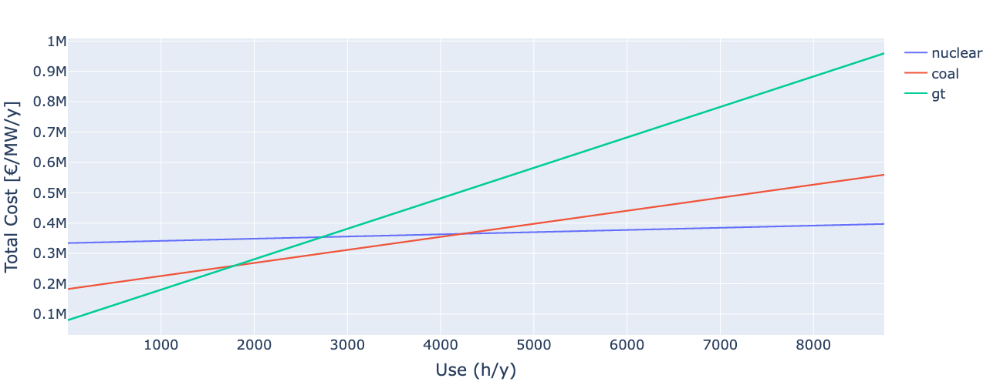

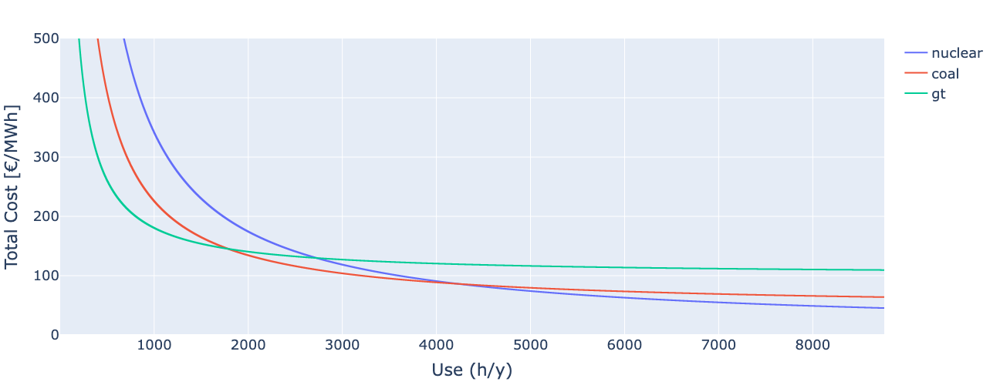

In [5]:
fig = go.Figure()
for m in set_machines:
    fig.add_trace(go.Scatter(x=U,y=data['cost tot_U'][m],line=dict(width=2.0,shape='hv'),mode='lines',name=m))

fig.update_layout(title="",yaxis_title='Total Cost [€/MW/y]',xaxis_title="Use (h/y)",
                  width=1000,height=500,margin=dict(l=50,r=150,b=30,t=50),font=dict(size=18))
fig.show()

print()

fig = go.Figure()
for m in set_machines:
    fig.add_trace(go.Scatter(x=U,y=data['cost tot'][m],line=dict(width=2.0,shape='hv'),mode='lines',name=m))

fig.update_layout(title="",yaxis_title='Total Cost [€/MWh]',xaxis_title="Use (h/y)",
                  width=1000,height=500,margin=dict(l=50,r=150,b=30,t=50),font=dict(size=18))
fig.update_yaxes(range=[0,500])
fig.show()

# Demand

The demand is calculated from RTE open data for 2015.

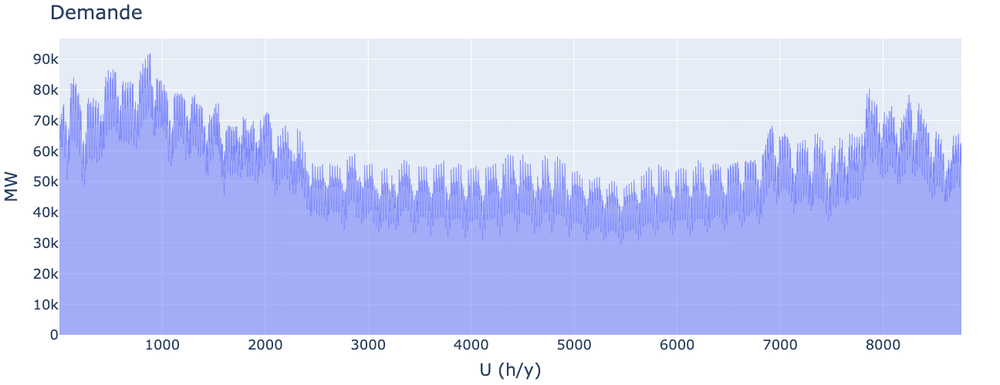

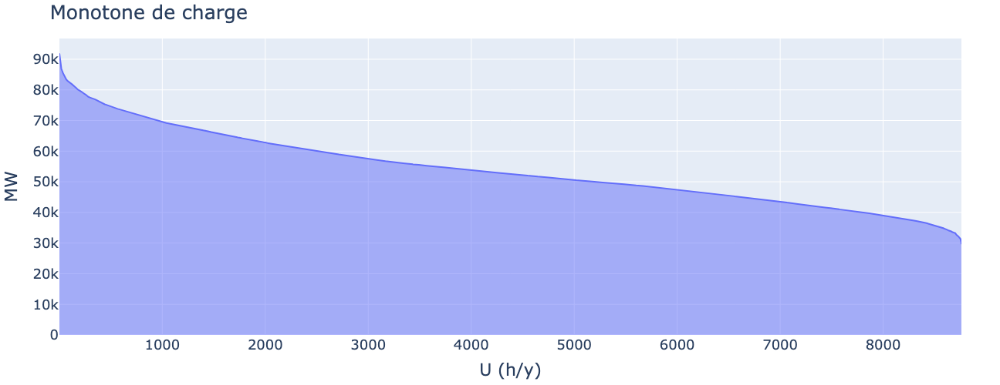

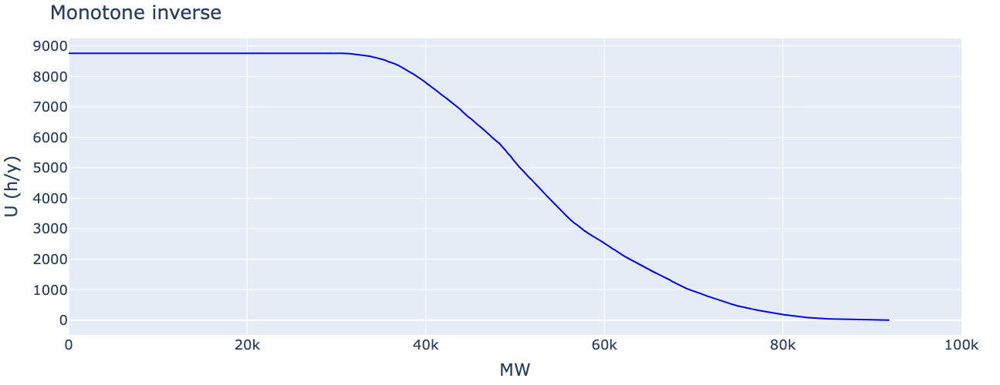

In [6]:
# Create demand dataframe
df = pd.read_excel(io='Include/Conso/Historique_consommation_INST_2015.xlsx',
                skiprows=18, 
                header=0, 
               )
df = df.dropna().reset_index()
df = df.drop(['index', 'Type de données'], axis=1)
df = df.set_index('Date')

# transforme squared shape into one column shape
demand = pd.DataFrame(df.values.flatten(), columns=['Conso[MW]'])
demand.index = demand.index +1

# skip 1/2 hour => 1 hour
Demand_MWh = demand.iloc[1::2].reset_index()
Demand_MWh = Demand_MWh.drop(['index'], axis=1)

#
# REN production and residual demand 
#
# Capacity [MW]
Capacity_PV  = 20e3
Capacity_WOF = 10e3
Capacity_WON = 20e3

Prod_REN = pd.DataFrame()

df = pd.read_csv('Include/PV/ninja_pv_country_FR_current.inc',sep=' ',skiprows=1,header=0,index_col=0)
Prod_REN['PV'] = df * Capacity_PV

df = pd.read_csv('Include/Wind/OnShore/ninja_wind_onshore_country_FR_2015.inc',sep=' ',skiprows=1,header=0,index_col=0)
Prod_REN['WON'] = df * Capacity_WON

df = pd.read_csv('Include/Wind/OffShore/ninja_wind_offshore_country_FR_2015.inc',sep=' ',skiprows=1,header=0,index_col=0)
Prod_REN['WOF'] = df * Capacity_WOF

Prod_REN = Prod_REN.groupby(Prod_REN.index // 2).mean().reset_index(drop=True)

if is_ren:
    Demand_MWh['Conso[MW]'] = Demand_MWh['Conso[MW]'] - Prod_REN.sum(axis=1)

# Add monotone
df_tmp = Demand_MWh[['Conso[MW]']].sort_values('Conso[MW]',ascending=False).add_suffix("_Sorted").reset_index(drop=True)
Demand_MWh = pd.concat([Demand_MWh, df_tmp], axis=1)
Demand_MWh.index = Demand_MWh.index +1

# Plotting
fig = go.Figure()

if is_ren:
    fig.add_trace(go.Scatter(x=Demand_MWh.index,y=Demand_MWh['Conso[MW]']+Prod_REN.sum(axis=1),line=dict(width=0.5),fill='tozeroy',name='Demand'))
    fig.add_trace(go.Scatter(x=Demand_MWh.index,y=Demand_MWh['Conso[MW]'],line=dict(width=0.5),fill='tozeroy',name='Demand Residual'))
    fig.add_trace(go.Scatter(x=Demand_MWh.index,y=Prod_REN.sum(axis=1),line=dict(width=0.5),fill='tozeroy',name='REN'))
else:
    fig.add_trace(go.Scatter(x=Demand_MWh.index,y=Demand_MWh['Conso[MW]'],line=dict(width=0.5),fill='tozeroy',name='Demand Residual'))

fig.update_layout(title="Demande",yaxis_title='MW',xaxis_title="U (h/y)",
                  width=1000,height=500,margin=dict(l=50,r=50,b=30,t=50),font=dict(size=18))
fig.show()

print()

fig = go.Figure()
fig.add_trace(go.Scatter(x=Demand_MWh.index,y=Demand_MWh['Conso[MW]_Sorted'],fill='tozeroy',name='Demand'))
fig.update_layout(title="Monotone de charge",yaxis_title='MW',xaxis_title="U (h/y)",
                  width=1000,height=500,margin=dict(l=50,r=50,b=30,t=50),font=dict(size=18))
fig.show()

print()

fig = go.Figure()
fig.add_trace(go.Scatter(x=Demand_MWh['Conso[MW]_Sorted'],y=Demand_MWh.index,line=dict(color='blue'),name='Inv Demand'))
fig.add_trace(go.Scatter(x=[0,min(Demand_MWh['Conso[MW]_Sorted'])],y=[max(set_time),max(set_time)],mode='lines',line=dict(color='blue'),name='Complement'))
fig.update_layout(title="Monotone inverse",yaxis_title='U (h/y)',xaxis_title="MW",
                  width=1000,height=500,margin=dict(l=50,r=50,b=30,t=50),font=dict(size=18),
                  showlegend=False)
fig.update_xaxes(range=[0,100000]) 
fig.show()


In [ ]:
opt_model = cpx.Model(name="interd model")

# Variable definition

- var_P : Installed power for each machines 
- var_E : Energy according to the time for each machines

In [7]:
P_max = max(Demand_MWh['Conso[MW]'])
E_max = max(Demand_MWh['Conso[MW]']) * 1

# Installed Power of machines
if is_var_P_variable:
    var_P = {(m):   opt_model.continuous_var( lb = 0, ub = P_max, name = 'P_' + m) for m in set_machines}
    else :
    var_P = {}
    # User's choice !!
    var_P['nuclear'] = 45572.0
    var_P['coal'] = 15046.0 
    var_P['gt'] = 31316.0

# Energy produced as m and t
var_E = {(m,t): opt_model.continuous_var( lb = 0, ub = E_max, name = 'Q_' + m + '_' + str(t) ) for m in set_machines for t in set_time}

# Constraints definition

In [8]:
opt_model.clear_constraints

# Convert dataframe to dict 
Demand_MWh_dict = Demand_MWh[['Conso[MW]']].to_dict()

# Supply (t) = Demand (t)
ct_balanceSD = {}
for t in set_time:
    ct_balanceSD[t] = opt_model.add_constraint(ct = opt_model.sum(var_E[m,t] for m in set_machines ) == Demand_MWh_dict['Conso[MW]'][t])

# E <= P * 1h for each machines
ct_maxE = {}
for m in set_machines:
    ct_maxE[m] = {}

for m in set_machines:
    for t in set_time:
        ct_maxE[m][t] = opt_model.add_constraint(ct = var_E[m,t] <= var_P[m])

# sum(P) >= max demand
ct_P = opt_model.add_constraint(ct = opt_model.sum( var_P[m] for m in set_machines ) >= max(Demand_MWh['Conso[MW]']))

# Autres contraintes ... ? 


# OBJECTIVE FUNCTION + SOLVE

In [9]:
# Total cost 
objective = opt_model.sum( (data['cost fix_cap'][m] + data['cost fix_om'][m])   * var_P[m] + 
                           (data['cost var_om'][m]  + data['cost var_fuel'][m]) * opt_model.sum(var_E[m,t] for t in set_time)
                           for m in set_machines
                         )

# Solve
opt_model.minimize(objective)
solution = opt_model.solve()


# Post process => Dataframe 

In [17]:
# Create the output dataframe => opt_df
columns = []
for m in set_machines:
    columns.append(m)

index = set_time
opt_df = pd.DataFrame(0, index=index, columns=columns)

# Fill the output dataframe
m_ind = 0
for m in set_machines:
    t_ind = 0
    for t in set_time:
        opt_df.iloc[t_ind, m_ind] = var_E[m,t].solution_value
        t_ind = t_ind + 1
    m_ind = m_ind + 1

# Sort the dataframe columns order according to increasing variable cost
sorted_keys = sorted(data['cost var'], key=lambda k: data['cost var'][k])
opt_df = opt_df[sorted_keys]

# Function that get the marginal techno
def get_marginal_techno(row):
    non_zero_values = row[row != 0]
    return non_zero_values.index[-1] if not non_zero_values.empty else np.nan

# Function that fill according to variable cost of the marginal column
def fill_from_marginal_techno(marginal_techno):
    if marginal_techno is not None:
        return data['cost var'][marginal_techno]
    else:
        return 'ERROR...'

# Create an explicit copy of the DataFrame
opt_df = opt_df.copy()
# Fill marginal techno
opt_df['marginal techno'] = opt_df.apply(get_marginal_techno, axis=1)
# Fill Price value at each hour
opt_df['Elec Price'] = opt_df['marginal techno'].apply(fill_from_marginal_techno)

# Add demand column
opt_df['Demand_MWh'] = pd.Series(Demand_MWh_dict['Conso[MW]']).values

# Add fixed cost (FC) and variable cost (VC) column
for m in set_machines:
    opt_df['FC ' + m + ' [$]'] = data['cost fix'][m] * var_P[m].solution_value / n_timestep
    opt_df['VC ' + m + ' [$]'] = data['cost var'][m] * opt_df[m]
    opt_df['C ' + m + ' [$]']  = opt_df['FC ' + m + ' [$]'] + opt_df['VC ' + m + ' [$]']

# Add Profit for each techno
for m in set_machines:
    opt_df['InfraM Rev ' + m + ' [$]'] = opt_df['Elec Price'] * opt_df[m] - opt_df['VC ' + m + ' [$]']
    opt_df['Profit ' + m + ' [$]'] = opt_df['Elec Price'] * opt_df[m] - opt_df['C ' + m + ' [$]']

# Change names of dataframe columns
for m in set_machines:
    opt_df.insert(opt_df.columns.get_loc(m) + 1, 'Prod ' + m + ' [MWh]', opt_df[m])
    opt_df = opt_df.drop(columns=[m])

# Price at each hours

In [18]:
opt_df['Profit gt [$]'].sum()/1e9

-2.2271910268034554

# Plotting result

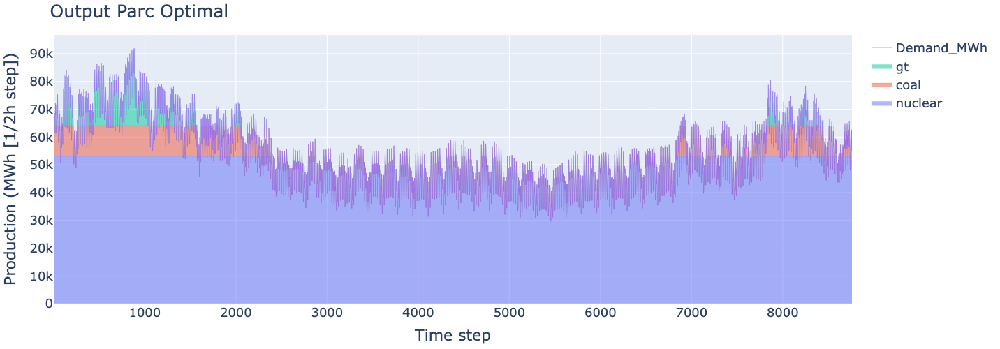

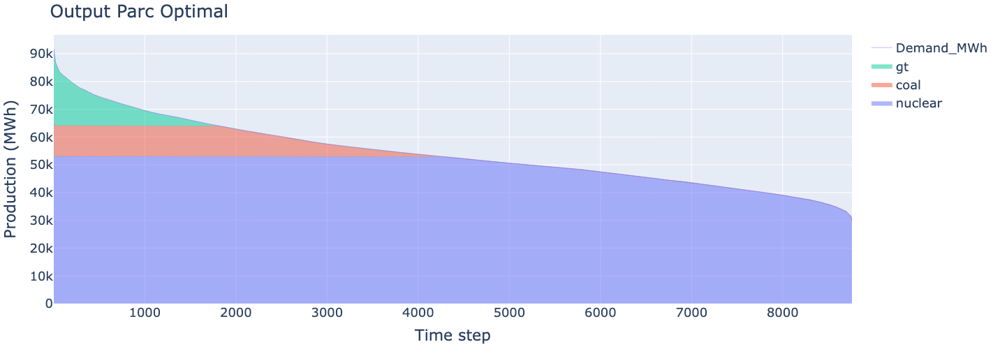

In [14]:
fig = go.Figure()

for m in set_machines:
    fig.add_trace(go.Scatter(x=opt_df.index,y=opt_df['Prod ' + m + ' [MWh]'],stackgroup='one',line=dict(width=0.2),name=m))
fig.add_trace(go.Scatter(x=opt_df.index,y=opt_df['Demand_MWh'],mode='lines',line=dict(width=1.0),opacity=0.50,name='Demand_MWh'))

fig.update_layout(title="Output Parc Optimal",
                  yaxis_title='Production (MWh [1/2h step])',
                  xaxis_title="Time step",
                  #barmode='stack',
                  width=1000,height=500,margin=dict(l=50,r=150,b=30,t=50),font=dict(size=18))
fig.show()

print()

fig = go.Figure()

for m in set_machines:
    fig.add_trace(go.Scatter(x=opt_df.index,y=opt_df.sort_values('Demand_MWh',ascending=False)['Prod ' + m + ' [MWh]'],stackgroup='one',line=dict(width=0.2),name=m))
fig.add_trace(go.Scatter(x=opt_df.index,y=opt_df.sort_values('Demand_MWh',ascending=False)['Demand_MWh'],mode='lines',line=dict(width=1.0),opacity=0.50,name='Demand_MWh'))

fig.update_layout(title="Output Parc Optimal",
                  yaxis_title='Production (MWh)',
                  xaxis_title="Time step",
                  #barmode='stack',
                  width=1000,height=500,margin=dict(l=50,r=150,b=30,t=50),font=dict(size=18))
fig.show()


In [ ]:
print("Required Installed Capacity : ")
for m in set_machines:
    print(m,var_P[m].solution_value)
